# Vault of vaults strategy

- Based on `10`
- Full backtesting period

# Set up

Set up Trading Strategy data client.


In [1]:
import logging

from tradingstrategy.client import Client
from tradeexecutor.utils.notebook import setup_charting_and_output, OutputMode, set_notebook_logging

client = Client.create_jupyter_client()

# Set up drawing charts in interactive vector output mode.
# This is slower. See the alternative commented option below.
# setup_charting_and_output(OutputMode.interactive)

# Set up rendering static PNG images.
# This is much faster but disables zoom on any chart.
setup_charting_and_output(OutputMode.static, image_format="png", width=1500, height=1000)


logger = logging.getLogger("strategy")



Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Chain configuration

- Choose target chains and their vults

In [2]:
from eth_defi.token import USDC_NATIVE_TOKEN
from eth_defi.token import USDT_NATIVE_TOKEN
from eth_defi.token import WRAPPED_NATIVE_TOKEN

from tradingstrategy.chain import ChainId
from tradingstrategy.lending import LendingProtocolType

CHAIN_ID = ChainId.arbitrum


# We define our main trading universe,
# and then Ethereum mainnet as a validation set
match CHAIN_ID:
    case ChainId.arbitrum:

        EXCHANGES = ("uniswap-v2", "uniswap-v3")
        SUPPORTING_PAIRS = [
            (ChainId.arbitrum, "uniswap-v3", "WETH", "USDC", 0.0005),
        ]
        LENDING_RESERVES = None
        PREFERRED_STABLECOIN = USDC_NATIVE_TOKEN[CHAIN_ID].lower()


        VAULTS = [
            (ChainId.arbitrum, "0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a"), # Plutus Hedge Token
            (ChainId.arbitrum, "0x959f3807f0aa7921e18c78b00b2819ba91e52fef"), # gmUSDC
            (ChainId.arbitrum, "0xd3443ee1e91af28e5fb858fbd0d72a63ba8046e0"), # gTrade (Gains) USDC
            (ChainId.arbitrum, "0x75288264fdfea8ce68e6d852696ab1ce2f3e5004"), # Hype++
            (ChainId.arbitrum, "0x4b6f1c9e5d470b97181786b26da0d0945a7cf027"), # Hypertrim USDC
            (ChainId.arbitrum, "0x0b2b2b2076d95dda7817e785989fe353fe955ef9"), # Staked USDai
            (ChainId.arbitrum, "0x64ca76e2525fc6ab2179300c15e343d73e42f958"), # Clearstar high yielsd USDC
            (ChainId.arbitrum, "0x7e97fa6893871a2751b5fe961978dccb2c201e65"), # Gauntlet
            (ChainId.arbitrum, "0x1a996cb54bb95462040408c06122d45d6cdb6096"), # Fluid
            (ChainId.arbitrum, "0xa91267a25939b2b0f046013fbf9597008f7f014b"), # IPOR USDC Arbirum optimise
            (ChainId.arbitrum, "0x05d28a86e057364f6ad1a88944297e58fc6160b3"), # Euler Arbitrum Yield USDC 
            (ChainId.arbitrum, "0x20d419a8e12c45f88fda7c5760bb6923cee27f98"), # Ostium liquidity provider
            (ChainId.arbitrum, "0x444868b6e8079ac2c55eea115250f92c2b2c4d14"), # Dolomite
            (ChainId.arbitrum, "0x9fa306b1f4a6a83fec98d8ebbabedff78c407f6b1"), # USDC-2 yVault
            (ChainId.arbitrum, "0x940098b108fb7d0a7e374f6eded7760787464609"),  # Spark USDC
            (ChainId.arbitrum, "0xb01a958d8e9dba566c6d71f66ef566ccf5fac859"),  # Harvest USDC
            (ChainId.arbitrum, "0x98c49e13bf99d7cad8069faa2a370933ec9ecf17"),  # Summerfi USDT

            # Some smaller entries to mix in
            # (ChainId.arbitrum, "0xc8248953429d707c6a2815653eca89846ffaa63b"), # Curve LLAMMA asdCRV / crvUSD
            (ChainId.arbitrum, "0xf63b7f49b4f5dc5d0e7e583cfd79dc64e646320c"), # Auto finance Tokemak ARB/USDC
            # (ChainId.arbitrum, "0xeeaf2ccb73a01deb38eca2947d963d64cfde6a32"), # Curve LLAMMA CRV / crvUSD
            (ChainId.arbitrum, "0xe5d6eb448ac5a762c1ebe8cd1692b9cd08025176"), # DAMM stablecoin fund

        ]        

        BENCHMARK_PAIRS = [
            (ChainId.arbitrum, "uniswap-v3", "WETH", "USDC", 0.0005),
        ]

        # Exclude Euro vaults, etc.
        # ALLOWED_VAULT_DENOMINATION_TOKENS = {"USDC", "USDT", "USDC.e"}
        ARBITRUM_STABLECOIN_ADDRESSES = {
            "USDC": "0xaf88d065e77c8cC2239327C5EDb3A432268e5831",
            "USDT": "0xFd086bC7CD5C481DCC9C85ebE478A1C0b69FCbb9",
            "USDC.e": "0xff970a61a04b1ca14834a43f5de4533ebddb5cc8",
            # "crvUSD": "0x498bf2b1e120fed3ad3d42ea2165e9b73f99c1e5",
            "USDai": "0x0A1a1A107E45b7Ced86833863f482BC5f4ed82EF",
            "USD₮0": "0xFd086bC7CD5C481DCC9C85ebE478A1C0b69FCbb9",  # Same as USDT
        }
        ALLOWED_VAULT_DENOMINATION_TOKENS = set(ARBITRUM_STABLECOIN_ADDRESSES.keys())
    
    case ChainId.base:
        raise NotImplementedError()
    case ChainId.ethereum:
        raise NotImplementedError()
    case ChainId.binance:
        raise NotImplementedError()
    case ChainId.avalanche:
        raise NotImplementedError()
    case _:
        raise NotImplementedError(f"Chain not supported: {CHAIN_ID}")

## Parameters

- Collection of parameters used in the calculations

In [3]:
import datetime

import pandas as pd


from tradingstrategy.timebucket import TimeBucket
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.parameters import StrategyParameters
from tradeexecutor.strategy.default_routing_options import TradeRouting

from tradeexecutor.utils.jupyter_notebook_name import get_notebook_id


class Parameters:

    id = get_notebook_id(globals())

    # We trade 1h candle
    candle_time_bucket = TimeBucket.d1
    cycle_duration = CycleDuration.cycle_7d
    
    chain_id = CHAIN_ID
    exchanges = EXCHANGES
    
    #
    # Basket size, risk and balancing parametrs.
    #   
    min_asset_universe = 6  # How many assets we need in the asset universe to start running the index
    max_assets_in_portfolio = 99  # How many assets our basket can hold once
    allocation = 0.95  # Allocate all cash to volatile pairs
    # min_rebalance_trade_threshold_pct = 0.05  # % of portfolio composition must change before triggering rebalacne
    individual_rebalance_min_threshold_usd = 500.0  # Don't make buys less than this amount
    sell_rebalance_min_threshold = 100.0
    sell_threshold = 0.05  # Sell if asset is more than 5% of the portfolio
    per_position_cap_of_pool = 0.33  # Never own more than % of the lit liquidity of the trading pool
    max_concentration = 0.33 # How large % can one asset be in a portfolio once
    min_portfolio_weight = 0.0050  # Close position / do not open if weight is less than 50 BPS

    # How long rolling returns window in bars (days)
    # Needed to calculate weights
    rolling_returns_bars = 35

    min_tvl = 50_000  # Minimum TVL in the vault before it can be considered investable

    #     
    #
    # Backtesting only
    # Limiting factor: Aave v3 on Base starts at the end of DEC 2023
    #
    backtest_start = datetime.datetime(2025, 1, 1)
    backtest_end = datetime.datetime(2026, 1, 15)
    initial_cash = 100_000

    #
    # Live only
    #
    routing = TradeRouting.default
    required_history_period = datetime.timedelta(days=365*3)
    slippage_tolerance = 0.0060  # 0.6% 
    assummed_liquidity_when_data_missings = 10_000
    

parameters = StrategyParameters.from_class(Parameters)  # Convert to AttributedDict to easier typing with dot notation

# Trading pairs and market data

- This creates the strategy universe containing pair metadata and their prices
- The universe is "masked" by simply selecting pairs on the predefined pairs list

In [4]:

from pathlib import Path
from typing import Callable
from tradingstrategy.pair import PandasPairUniverse


from eth_defi.vault.vaultdb import DEFAULT_RAW_PRICE_DATABASE

from tradingstrategy.utils.token_filter import add_base_quote_address_columns
from tradingstrategy.utils.token_filter import filter_for_exchange_slugs
from tradingstrategy.utils.token_filter import filter_pairs_default
from tradingstrategy.utils.token_filter import filter_for_selected_pairs
from tradingstrategy.utils.token_extra_data import load_token_metadata
from tradingstrategy.utils.token_filter import deduplicate_pairs_by_volume
from tradingstrategy.utils.token_extra_data import load_token_metadata
from tradingstrategy.alternative_data.vault import load_vault_database


from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.strategy.execution_context import ExecutionContext, notebook_execution_context
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data
from tradeexecutor.strategy.execution_context import ExecutionContext, notebook_execution_context
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.analysis.pair import display_strategy_universe
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.analysis.vault import display_vaults



# Hack to support vault data exposure to live trading universe creation
from dotenv import load_dotenv
load_dotenv(override=True)  # Loads variables from .env file


def create_trading_universe(
    input: CreateTradingUniverseInput,
) -> TradingStrategyUniverse:
    """Create the trading universe.

    - Load Trading Strategy full pairs dataset

    - Load built-in Coingecko top 1000 dataset

    - Get all DEX tokens for a certain Coigecko category

    - Load OHCLV data for these pairs

    - Load also BTC and ETH price data to be used as a benchmark
    """

    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    parameters = input.parameters or Parameters  # Some CLI commands do not support yet passing this
    universe_options = input.universe_options

    if execution_context.live_trading:
        # Live trading, send strategy universe formation details
        # to logs
        debug_printer = logger.info
    else:
        # Jupyter notebook inline output
        debug_printer = print

    chain_id = parameters.chain_id

    debug_printer(f"Preparing trading universe on chain {chain_id.get_name()}")

    # Pull out our benchmark pairs ids.
    # We need to construct pair universe object for the symbolic lookup.
    # TODO: PandasPairUniverse(buidl_index=True) - speed this up by skipping index building
    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df= filter_for_selected_pairs(
        all_pairs_df,
        SUPPORTING_PAIRS,
    )    

    debug_printer(f"We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy")

    # Check which vaults we can include based on allowed deposit tokens for this backtest
    vault_universe = load_vault_database()
    total_vaults = vault_universe.get_vault_count()
    vault_universe = vault_universe.limit_to_vaults(VAULTS, check_all_vaults_found=False)
    vault_universe = vault_universe.limit_to_denomination(ALLOWED_VAULT_DENOMINATION_TOKENS, check_all_vaults_found=True)
    debug_printer(f"Loaded total {vault_universe.get_vault_count()} vaults from the total of {total_vaults} in vault database")

    # Default vault data bundle path for backtesting
    vault_bundled_price_data = DEFAULT_RAW_PRICE_DATABASE
    debug_printer(f"Using vault price data for backtesting from {vault_bundled_price_data}")

    dataset = load_partial_data(
        client=client,
        time_bucket=parameters.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_bundled_price_data=vault_bundled_price_data if not execution_context.live_trading else None,
        check_all_vaults_found=True,
    )

    debug_printer("Creating strategy universe with price feeds and vaults")
    strategy_universe = TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=PREFERRED_STABLECOIN,
        forward_fill=True,  # We got very gappy data from low liquid DEX coins
        forward_fill_until=timestamp,
    )

    # crvUSD etc. do not have backtesting paths yet
    strategy_universe.ignore_routing = True

    # Dump our vault data and check for data errors
    display_vaults(
        vault_universe,
        strategy_universe,
        execution_mode=execution_context.mode,
        printer=debug_printer,  
    )

    return strategy_universe


universe_input = CreateTradingUniverseInput(
    execution_context=notebook_execution_context,
    client=client,
    timestamp=None,
    parameters=parameters,
    universe_options=UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context),
    execution_model=None,
)

strategy_universe = create_trading_universe(universe_input)


print("Universe creation done")

df = display_strategy_universe(
    strategy_universe, 
    sort_key="base",
    sort_numeric=False,
    limit=75,
    show_token_risk=True,
    show_tokensniffer=True,
)

df = df.head(10)

from IPython.display import display, HTML
html_table = df.to_html(escape=False, classes='table table-striped')
display(HTML(html_table))


Preparing trading universe on chain Arbitrum One
We have total 387449 pairs in dataset and going to use 1 pairs for the strategy
Loaded total 18 vaults from the total of 21196 in vault database
Using vault price data for backtesting from /Users/moo/.tradingstrategy/vaults/cleaned-vault-prices-1h.parquet


Loading TVL/liquidity data for 1 pairs:   0%|          | 0/1 [00:00<?, ?it/s]

Creating strategy universe with price feeds and vaults
Vault check list


,Chain,Vault,Name,Protocol,Denomination,Status
0,Arbitrum,0xd3443ee1e91af28e5fb858fbd0d72a63ba8046e0,gTrade (Gains Network USDC),gains-network,USDC,OK
1,Arbitrum,0x959f3807f0aa7921e18c78b00b2819ba91e52fef,gmUSDC,umami,USDC,OK
2,Arbitrum,0x1a996cb54bb95462040408c06122d45d6cdb6096,Fluid USD Coin,fluid,USDC,OK
3,Arbitrum,0x20d419a8e12c45f88fda7c5760bb6923cee27f98,Ostium Liquidity Pool Vault,ostium,USDC,OK
4,Arbitrum,0xa91267a25939b2b0f046013fbf9597008f7f014b,IPOR USDC Arbitrum Optimizer,ipor,USDC,OK
5,Arbitrum,0xb01a958d8e9dba566c6d71f66ef566ccf5fac859,Harvest: USDC Vault (0xB01a),harvest-finance,USDC,OK
6,Arbitrum,0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,HYPE++,d2-finance,USDC,OK
7,Arbitrum,0x444868b6e8079ac2c55eea115250f92c2b2c4d14,Dolomite: USDC,dolomite,USDC,OK
8,Arbitrum,0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a,Plutus Hedge Token,plutus,USDC,OK
9,Arbitrum,0x98c49e13bf99d7cad8069faa2a370933ec9ecf17,Summer.fi USD₮0,summer.fi,USD₮0,OK


Universe creation done
Results limited to first 75 entries


,base,quote,exchange,type,fee %,price,last_price_at,first_price_at,volume,tvl,tvl_at,tax,tokensniffer_risk_score,token_risk_score,token_risk_flags,pfee,mfee
id,,,,,,,,,,,,,,,,,
272824664,CSHYUSDC,USDC,morpho,traded,NaN,1.02,3 days,2025-10-17,0.00,"114,864",3 days,- / -,None,None,-,10.0%,0.0%
268587382,DAMMstable,USD₮0,lagoon-finance,traded,NaN,1.03,2 days,2025-08-12,0.00,"1,610,131",2 days,- / -,None,None,-,17.5%,0.2%
272519172,HYPE++,USDC,d2-finance,traded,NaN,1.43,2 days,2024-11-20,0.00,"4,241,570",2 days,- / -,None,None,-,20.0%,0.0%
278843159,LVUSDT,USD₮0,summer.fi,traded,NaN,1.04,2 days,2025-02-10,0.00,"488,437",2 days,- / -,None,None,-,0.0%,1.0%
2991521,WETH,USDC,uniswap-v3,traded,0.05,3317.60,12 days,2025-01-01,1568328.88,"1,537,668",12 days,0.0% / 0.0%,None,None,-,NaN,NaN
273035788,arbUSD,USDC,auto-finance,traded,NaN,1.09,2 days,2025-09-09,0.00,"1,696,973",2 days,- / -,None,None,-,0.0%,0.0%
271338772,dUSDC,USDC,dolomite,traded,NaN,1.25,1 days,2024-12-20,0.00,"9,337,802",1 days,- / -,None,None,-,0.0%,0.0%
274817203,eUSDC-5,USDC,euler,traded,NaN,1.02,1 days,2025-09-01,0.00,"8,647,864",1 days,- / -,None,None,-,10.0%,0.0%
284870745,fUSDC,USDC,harvest-finance,traded,NaN,1.10,3 days,2024-10-07,0.00,"11,000",3 days,- / -,None,None,-,0.0%,0.0%


## Asset to trading pair map

- Build a helper map
- Because we are operating on trading pairs, not on tokens, which are the base asset of a trading pair, we set up 
  this map to easily look up the selected trading pair by its symbol

In [5]:
from tradingstrategy.types import TokenSymbol
from tradeexecutor.state.identifier import TradingPairIdentifier

# Create base token symbol to pair map to help later
# Token
token_map: dict[TokenSymbol, TradingPairIdentifier] = {p.base.token_symbol: p for p in strategy_universe.iterate_pairs()}

# Tokens part of benchmark data, but not the strategy
benchmark_pair_ids = [p.internal_id for p in strategy_universe.iterate_pairs() if p.other_data.get("benchmark") is True]
category_pair_ids = [p.internal_id for p in strategy_universe.iterate_pairs() if p.other_data.get("benchmark") is not True]

print(f"Token map is {len(token_map)} assets")
print("Category trading pairs", len(category_pair_ids))
print("Benchmark trading pairs", len(benchmark_pair_ids))

Token map is 18 assets
Category trading pairs 19
Benchmark trading pairs 0


# Indicators

- Precalculate indicators used by the strategy

In [6]:
import pandas as pd
from IPython.display import HTML
import pandas_ta

from tradeexecutor.strategy.pandas_trader.indicator import IndicatorSource
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.strategy.pandas_trader.indicator import calculate_and_load_indicators_inline
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorDependencyResolver
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.analysis.indicator import display_indicators
from tradingstrategy.utils.groupeduniverse import resample_candles


indicators = IndicatorRegistry()

empty_series = pd.Series([], index=pd.DatetimeIndex([]))


@indicators.define()
def rolling_returns(
    close: pd.Series,
    rolling_returns_bars,
) -> pd.Series:
    """Calculate rolling returns over a period
    """
    lagged_close = close.shift(rolling_returns_bars)
    series = close / lagged_close - 1
    return series


@indicators.define(source=IndicatorSource.tvl)
def tvl(
    close: pd.Series,
    execution_context: ExecutionContext,
    timestamp: pd.Timestamp,
) -> pd.Series:
    """Get TVL series for a pair.

    - Because TVL data is 1d and we use 1h everywhere else, we need to forward fill

    - Use previous hourly close as the value
    """
    if execution_context.live_trading:
        # TVL is daily data.
        # We need to forward fill until the current hour.
        # Use our special ff function.        
        assert isinstance(timestamp, pd.Timestamp), f"Live trading needs forward-fill end time, we got {timestamp}"
        from tradingstrategy.utils.forward_fill import forward_fill
        df = pd.DataFrame({"close": close})
        df_ff = forward_fill(
            df,
            Parameters.candle_time_bucket.to_frequency(),
            columns=("close",),
            forward_fill_until=timestamp,
        )
        series = df_ff["close"]
        return series
    else:
        return close.resample("1h").ffill()


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(   
    min_tvl: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    """The pair must have min XX,XXX USD one-sided TVL to be included.

    - If the Uniswap pool does not have enough ETH or USDC deposited, skip the pair as a scam

    :return:
        Series where each timestamp is a list of pair ids meeting the criteria at that timestamp
    """
    
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl
    # Turn to a series of lists
    mask_true_values_only = mask[mask == True]
    series = mask_true_values_only.groupby(level='timestamp').apply(lambda x: x.index.get_level_values('pair_id').tolist())
    return series



@indicators.define(
    source=IndicatorSource.strategy_universe
)
def trading_availability_criteria(
    strategy_universe: TradingStrategyUniverse,
) -> pd.Series:
    """Is pair tradeable at each hour.

    - The pair has a price candle at that
    - Mitigates very corner case issues that TVL/liquidity data is per-day whileas price data is natively per 1h
      and the strategy inclusion criteria may include pair too early hour based on TVL only,
      leading to a failed attempt to rebalance in a backtest
    - Only relevant for backtesting issues if we make an unlucky trade on the starting date
      of trading pair listing

    :return:
        Series with with index (timestamp) and values (list of pair ids trading at that hour)
    """
    # Trading pair availability is defined if there is a open candle in the index for it.
    # Because candle data is forward filled, we should not have any gaps in the index.
    candle_series = strategy_universe.data_universe.candles.df["open"]
    pairs_per_timestamp = candle_series.groupby(level='timestamp').apply(lambda x: x.index.get_level_values('pair_id').tolist())
    return pairs_per_timestamp


@indicators.define(
    dependencies=[
        tvl_inclusion_criteria,
        trading_availability_criteria
    ],
    source=IndicatorSource.strategy_universe
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver
) -> pd.Series:
    """Pairs meeting all of our inclusion criteria.

    - Give the tradeable pair set for each timestamp

    :return:
        Series where index is timestamp and each cell is a list of pair ids matching our inclusion criteria at that moment
    """

    # Filter out benchmark pairs like WETH in the tradeable pair set
    benchmark_pair_ids = set(strategy_universe.get_pair_by_human_description(desc).internal_id for desc in SUPPORTING_PAIRS)

    tvl_series = dependency_resolver.get_indicator_data(
        tvl_inclusion_criteria,
        parameters={
            "min_tvl": min_tvl,
        },
    )

    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)

    #
    # Process all pair ids as a set and the final inclusion
    # criteria is union of all sub-criterias
    #

    df = pd.DataFrame({
        "tvl_pair_ids": tvl_series,
        "trading_availability_pair_ids": trading_availability_series,
    })

    # https://stackoverflow.com/questions/33199193/how-to-fill-dataframe-nan-values-with-empty-list-in-pandas
    df = df.fillna("").apply(list)

    def _combine_criteria(row):
        final_set = set(row["tvl_pair_ids"]) & \
                    set(row["trading_availability_pair_ids"])
        return final_set - benchmark_pair_ids

    union_criteria = df.apply(_combine_criteria, axis=1)

    # Inclusion criteria data can be spotty at the beginning when there is only 0 or 1 pairs trading,
    # so we need to fill gaps to 0
    full_index = pd.date_range(
        start=union_criteria.index.min(),
        end=union_criteria.index.max(),
        freq=Parameters.candle_time_bucket.to_frequency(),
    )
    reindexed = union_criteria.reindex(full_index, fill_value=[])
    return reindexed


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(
        min_tvl: USDollarAmount,
        dependency_resolver: IndicatorDependencyResolver
) -> pd.Series:
    """Calculate number of pairs in meeting volatility criteria on each timestamp"""
    series = dependency_resolver.get_indicator_data(
        tvl_inclusion_criteria,
        parameters={"min_tvl": min_tvl},
    )
    series = series.apply(len)

    # TVL data can be spotty at the beginning when there is only 0 or 1 pairs trading,
    # so we need to fill gaps to 0
    full_index = pd.date_range(
        start=series.index.min(),
        end=series.index.max(),
        freq=Parameters.candle_time_bucket.to_frequency(),
    )
    # Reindex and fill NaN with zeros
    reindexed = series.reindex(full_index, fill_value=0)
    return reindexed


@indicators.define(dependencies=(inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def all_criteria_included_pair_count(
    min_tvl: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver
) -> pd.Series:
    """Series where each timestamp is the list of pairs meeting all inclusion criteria.

    :return:
        Series with pair count for each timestamp
    """
    series = dependency_resolver.get_indicator_data(
        "inclusion_criteria",
        parameters={
            "min_tvl": min_tvl, 
        },
    )
    return series.apply(len)


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_pair_count(
    strategy_universe: TradingStrategyUniverse,
) -> pd.Series:
    """Get number of pairs that trade at each timestamp.

    - Pair must have had at least one candle before the timestamp to be included

    - Exclude benchmarks pairs we do not trade

    :return:
        Series with pair count for each timestamp
    """

    benchmark_pair_ids = {strategy_universe.get_pair_by_human_description(desc).internal_id for desc in SUPPORTING_PAIRS}

    # Get pair_id, timestamp -> timestamp, pair_id index
    series = strategy_universe.data_universe.candles.df["open"]    
    swap_index = series.index.swaplevel(0, 1)

    seen_pairs = set()
    seen_data = {}

    for timestamp, pair_id in swap_index:
        if pair_id in benchmark_pair_ids:
            continue
        seen_pairs.add(pair_id)
        seen_data [timestamp] = len(seen_pairs)

    series = pd.Series(seen_data.values(), index=list(seen_data.keys()))
    return series



@indicators.define(
    source=IndicatorSource.dependencies_only_per_pair,
    dependencies=[
        rolling_returns,
        inclusion_criteria,
    ]
)
def signal(
    rolling_returns_bars: int,
    candle_time_bucket: TimeBucket,
    min_tvl: USDollarAmount,
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver
) -> pd.Series:
    """Calculate weighting criteria ("signal") as the past returns of the rolling returns window.

    Only returns signal if the pair meets inclusion criteria at that timepoint.
    """

    inclusion_criteria_series = dependency_resolver.get_indicator_data(
        "inclusion_criteria",
        parameters={
            "min_tvl": min_tvl,
        },
    )

    # A benchmark asset
    if not pair.is_vault():
        zeros = pd.Series(0, index=inclusion_criteria_series.index)
        return zeros

    rolling_returns_series = dependency_resolver.get_indicator_data(
        "rolling_returns",
        parameters={
            "rolling_returns_bars": rolling_returns_bars,
        },
        pair=pair,
    )
    # return rolling_returns_series

    # Create a mask where True means the pair is included at that timestamp
    pair_id = pair.internal_id
    inclusion_mask = inclusion_criteria_series.apply(lambda x: pair_id in x)
    
    smoothed_returns = rolling_returns_series.ewm(span=rolling_returns_bars).mean()

    # Set signal zero for the periods when the pair was not included
    return smoothed_returns * inclusion_mask


display_indicators(indicators)


# Calculate all indicators where parameters have changed and store the result on disk
indicator_data = calculate_and_load_indicators_inline(
    strategy_universe=strategy_universe,
    create_indicators=indicators.create_indicators,
    parameters=parameters,
)

We have 9 indicators:


Reading cached indicators rolling_returns, tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusi…

Using indicator cache /Users/moo/.cache/indicators/arbitrum_1d_19_2024-01-18-2026-01-26_ff


# Trading universe charts

- Define charts used in backtesting and live execution



In [7]:
from plotly.graph_objects import Figure
from tradeexecutor.strategy.chart.definition import ChartRegistry, ChartKind, ChartInput
from tradeexecutor.strategy.chart.renderer import ChartBacktestRenderingSetup
from tradeexecutor.strategy.chart.standard.trading_universe import available_trading_pairs
from tradeexecutor.strategy.chart.standard.trading_universe import inclusion_criteria_check 
from tradeexecutor.strategy.chart.standard.volatility import volatility_benchmark
from tradeexecutor.strategy.chart.standard.signal import signal_comparison as _signal_comparison
from tradeexecutor.strategy.chart.standard.signal import price_vs_signal
from tradeexecutor.strategy.chart.standard.vault import all_vaults_share_price_and_tvl
from tradeexecutor.strategy.chart.standard.vault import vault_position_timeline
from tradeexecutor.strategy.chart.standard.vault import all_vault_positions
from tradeexecutor.strategy.chart.standard.equity_curve import equity_curve
from tradeexecutor.strategy.chart.standard.equity_curve import equity_curve_with_drawdown
from tradeexecutor.strategy.chart.standard.performance_metrics import performance_metrics
from tradeexecutor.strategy.chart.standard.weight import volatile_weights_by_percent
from tradeexecutor.strategy.chart.standard.weight import volatile_and_non_volatile_percent
from tradeexecutor.strategy.chart.standard.weight import equity_curve_by_asset
from tradeexecutor.strategy.chart.standard.weight import weight_allocation_statistics
from tradeexecutor.strategy.chart.standard.position import positions_at_end
from tradeexecutor.strategy.chart.standard.thinking import last_messages
from tradeexecutor.strategy.chart.standard.alpha_model import alpha_model_diagnostics
from tradeexecutor.strategy.chart.standard.profit_breakdown import trading_pair_breakdown
from tradeexecutor.strategy.chart.standard.trading_metrics import trading_metrics
from tradeexecutor.strategy.chart.standard.interest import lending_pool_interest_accrued
from tradeexecutor.strategy.chart.standard.interest import vault_statistics
from tradeexecutor.strategy.chart.standard.single_pair import trading_pair_positions
from tradeexecutor.strategy.chart.standard.single_pair import trading_pair_price_and_trades
from tradeexecutor.strategy.chart.standard.vault import all_vaults_share_price_and_tvl as _all_vaults_share_price_and_tvl


def equity_curve_with_benchmark(input: ChartInput) -> list[Figure]:
    """Add our benchmark token"""
    return equity_curve(
        input,
        benchmark_token_symbols=["ETH"],
    )


def all_vaults_share_price_and_tvl(input: ChartInput) -> list[Figure]:
    """Limit max_count"""
    return _all_vaults_share_price_and_tvl(
        input,
        max_count=2,
    )

def signal_comparison(input: ChartInput) -> list[Figure]:
    """Choose vaults only"""

    input = input.copy()
    input.pairs = [p for p in input.strategy_universe.iterate_pairs() if p.is_vault()]
    return _signal_comparison(
        input,
    )


# Define charts we use in backtesting and live trading
charts = ChartRegistry(default_benchmark_pairs=BENCHMARK_PAIRS)
charts.register(available_trading_pairs, ChartKind.indicator_all_pairs)
charts.register(inclusion_criteria_check, ChartKind.indicator_all_pairs)
charts.register(volatility_benchmark, ChartKind.indicator_multi_pair)
charts.register(signal_comparison, ChartKind.indicator_multi_pair)
charts.register(price_vs_signal, ChartKind.indicator_multi_pair)
charts.register(all_vaults_share_price_and_tvl, ChartKind.indicator_all_pairs)
charts.register(equity_curve_with_benchmark, ChartKind.state_all_pairs)
charts.register(equity_curve_with_drawdown, ChartKind.state_all_pairs)
charts.register(performance_metrics, ChartKind.state_all_pairs)
charts.register(volatile_weights_by_percent, ChartKind.state_all_pairs)
charts.register(volatile_and_non_volatile_percent, ChartKind.state_all_pairs)
charts.register(equity_curve_by_asset, ChartKind.state_all_pairs)
charts.register(weight_allocation_statistics, ChartKind.state_all_pairs)
charts.register(positions_at_end, ChartKind.state_all_pairs)
charts.register(last_messages, ChartKind.state_all_pairs)
charts.register(alpha_model_diagnostics, ChartKind.state_all_pairs)
charts.register(trading_pair_breakdown, ChartKind.state_all_pairs)
charts.register(trading_metrics, ChartKind.state_all_pairs)
charts.register(lending_pool_interest_accrued, ChartKind.state_all_pairs)
charts.register(vault_statistics, ChartKind.state_all_pairs)
charts.register(vault_position_timeline, ChartKind.state_single_vault_pair)
charts.register(all_vault_positions, ChartKind.state_single_vault_pair)
charts.register(trading_pair_positions, ChartKind.state_single_vault_pair)
charts.register(trading_pair_price_and_trades, ChartKind.state_single_vault_pair)
charts.register(inclusion_criteria_check, ChartKind.indicator_all_pairs)

# Chart rendering pre-backtest execution
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    backtest_end_at=Parameters.backtest_end,
)


## Available pairs

- Number of pairs available to trade every month


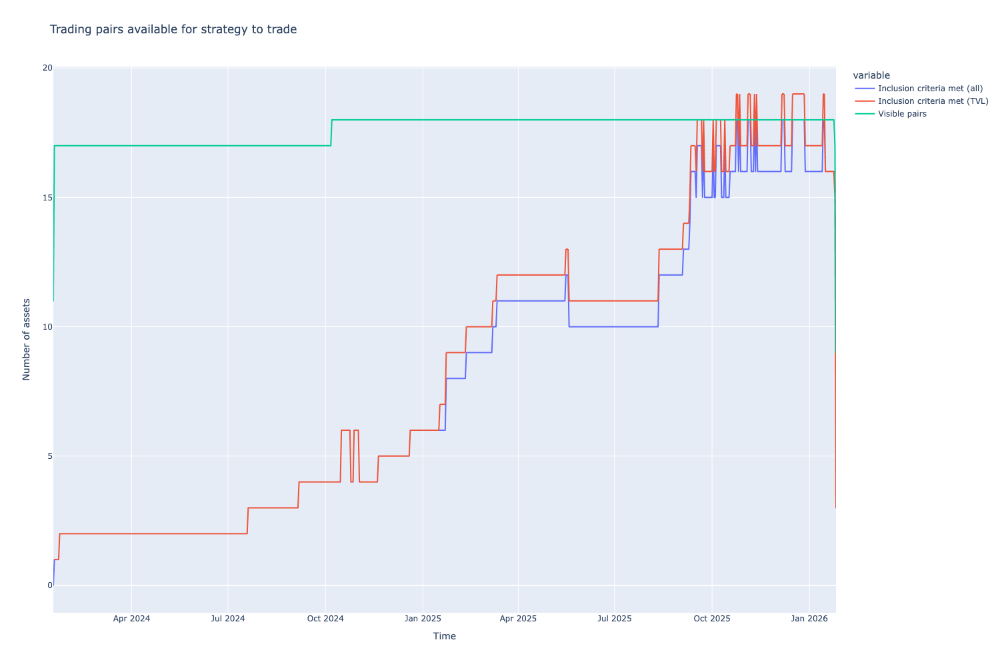

,Inclusion criteria met (all),Inclusion criteria met (TVL),Visible pairs
2026-01-22,16,16.0,18
2026-01-23,16,16.0,18
2026-01-24,16,16.0,18
2026-01-25,15,15.0,17
2026-01-26,3,3.0,9


In [8]:
fig, df = chart_renderer.render(available_trading_pairs, with_dataframe=True)
fig.show()
display(df.tail(5))

## Inclusion criteria checks

- Examine when different pairs got included and what was the pair status during the inclusion

In [9]:

df = chart_renderer.render(inclusion_criteria_check)

print(f"First appearances of {len(df)} trading pairs, when they meet all inclusion criteria:")

with pd.option_context("display.float_format", "{:,.2f}".format):
    display(df.head(5))


First appearances of 18 trading pairs, when they meet all inclusion criteria:


,Included at,Ticker,Venue,TVL at inclusion,TVL at end
283455471,2024-01-19,gmUSDC,umami,"74,836.20","115,099.45"
276842208,2024-01-24,gTrade (Gains Network USDC),gains-network,"231,998.38","15,173,534.31"
283279256,2024-07-20,Ostium Liquidity Pool Vault,ostium,"129,703.17","36,250,220.23"
276758859,2024-09-06,IPOR USDC Arbitrum Optimizer,ipor,"688,693.24","327,884.66"
284870745,2024-10-16,Harvest: USDC Vault (0xB01a),harvest-finance,"392,153.46","69,824.42"


## Signal comparison

- Weight signal for different vaults at the moment of time
- The signal is masked by the inclusion criteria


Rolling returns:


,WETH-USDC,gUSDC-USDC,gmUSDC-USDC,fUSDC-USDC,oLP-USDC,ipUSDCfusion-USDC,fUSDC-USDC,HYPE++-USDC,dUSDC-USDC,plvHedge-USDC,LVUSDT-USD₮0,sUSDC-USDC,sUSDai-USDai,gtUSDCc-USDC,DAMMstable-USD₮0,eUSDC-5-USDC,arbUSD-USDC,hyperUSDC-USDC,CSHYUSDC-USDC
timestamp,,,,,,,,,,,,,,,,,,,
2026-01-22,NaN,0.005883,0.000538,0.003117,0.065062,0.000860,0.003117,0.007348,0.004174,0.006686,0.002021,0.003846,0.006515,0.004138,0.005315,0.004961,0.004342,0.005306,0.005144
2026-01-23,NaN,0.005962,0.000940,0.003032,0.063008,0.000744,0.003032,0.007348,0.004151,0.006686,0.001992,0.003730,0.006465,0.004188,0.005315,0.005019,0.004333,0.005413,0.005144
2026-01-24,NaN,0.005945,0.001364,0.003616,0.067055,0.000684,0.003616,0.007348,0.004132,0.006686,0.001978,0.003731,0.006472,0.004186,0.005315,0.005034,0.004363,0.005376,0.005245
2026-01-25,NaN,0.005985,0.002435,NaN,0.067187,0.000607,NaN,0.007348,0.004140,0.006686,0.001979,0.003749,0.006297,0.004232,0.005315,0.005054,0.004440,0.005422,NaN
2026-01-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004038,NaN,NaN,NaN,NaN,NaN,NaN,0.004879,NaN,0.005321,NaN


Derived signal with inclusion mask:


,WETH-USDC,gUSDC-USDC,gmUSDC-USDC,fUSDC-USDC,oLP-USDC,ipUSDCfusion-USDC,fUSDC-USDC,HYPE++-USDC,dUSDC-USDC,plvHedge-USDC,LVUSDT-USD₮0,sUSDC-USDC,sUSDai-USDai,gtUSDCc-USDC,DAMMstable-USD₮0,eUSDC-5-USDC,arbUSD-USDC,hyperUSDC-USDC,CSHYUSDC-USDC
timestamp,,,,,,,,,,,,,,,,,,,
2026-01-22,0.0,0.007325,0.005610,0.0,0.040066,0.001681,0.0,0.010184,0.004354,0.009499,0.002519,0.003868,0.007256,0.004111,0.007141,0.004875,0.005505,0.005464,0.005403
2026-01-23,0.0,0.007250,0.005351,0.0,0.041340,0.001629,0.0,0.010026,0.004343,0.009343,0.002490,0.003860,0.007212,0.004116,0.007040,0.004883,0.005440,0.005461,0.005388
2026-01-24,0.0,0.007177,0.005129,0.0,0.042769,0.001576,0.0,0.009878,0.004331,0.009195,0.002461,0.003853,0.007171,0.004120,0.006944,0.004891,0.005380,0.005456,0.005380
2026-01-25,0.0,0.007111,0.004980,NaN,0.044125,0.001522,NaN,0.009737,0.004321,0.009056,0.002434,0.003847,0.007122,0.004126,0.006853,0.004900,0.005327,0.005454,NaN
2026-01-26,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004305,NaN,NaN,NaN,NaN,NaN,NaN,0.004899,NaN,0.005447,NaN


data keys: dict_keys(['gTrade (Gains Network USDC)', 'gmUSDC', 'Fluid USD Coin', 'Ostium Liquidity Pool Vault', 'IPOR USDC Arbitrum Optimizer', 'Harvest: USDC Vault (0xB01a)', 'HYPE++', 'Dolomite: USDC', 'Plutus Hedge Token', 'Summer.fi USD₮0', 'Spark USDC Vault', 'Staked USDai', 'Gauntlet USDC Core', 'DAMM Stablecoin Fund', 'Euler Arbitrum Yield USDC', 'Tokemak arbUSD', 'Hyperithm USDC', 'Clearstar High Yield USDC'])


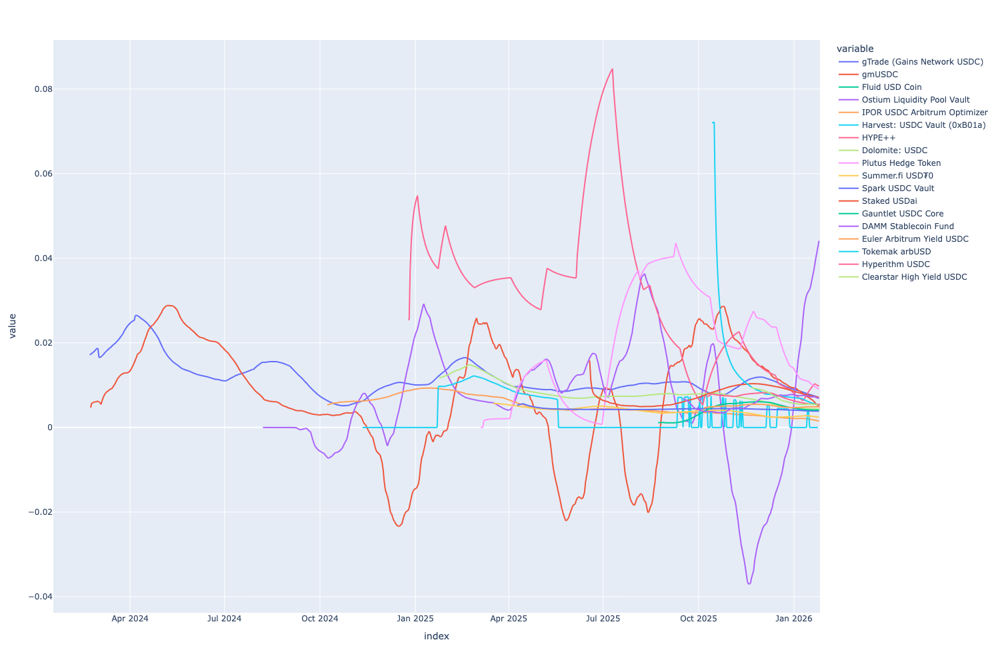

In [10]:
# Take signal (pair_id, timestamp) multiindex series and get it to human-readable form

# Take signal (pair_id, timestamp) multiindex series and get it to human-readable form
rolling_returns_series = indicator_data.get_indicator_data_pairs_combined("rolling_returns")
rolling_returns_df = rolling_returns_series.unstack(level='pair_id')

# Rename pair_id columns to human-readable vault/pair names
print("Rolling returns:")
rolling_returns_df.columns = [
    strategy_universe.get_pair_by_id(pair_id).get_ticker()
    for pair_id in rolling_returns_df.columns
]
display(rolling_returns_df.tail(5))

print("Derived signal with inclusion mask:")
signal_series = indicator_data.get_indicator_data_pairs_combined("signal")
signal_df = signal_series.unstack(level='pair_id')

# Rename pair_id columns to human-readable vault/pair names
signal_df.columns = [
    strategy_universe.get_pair_by_id(pair_id).get_ticker()
    for pair_id in signal_df.columns
]

display(signal_df.tail(5))

fig = chart_renderer.render(signal_comparison)
fig.show()

## Vault TVL and share price data

- Examine returns of the vaults used in this backtest

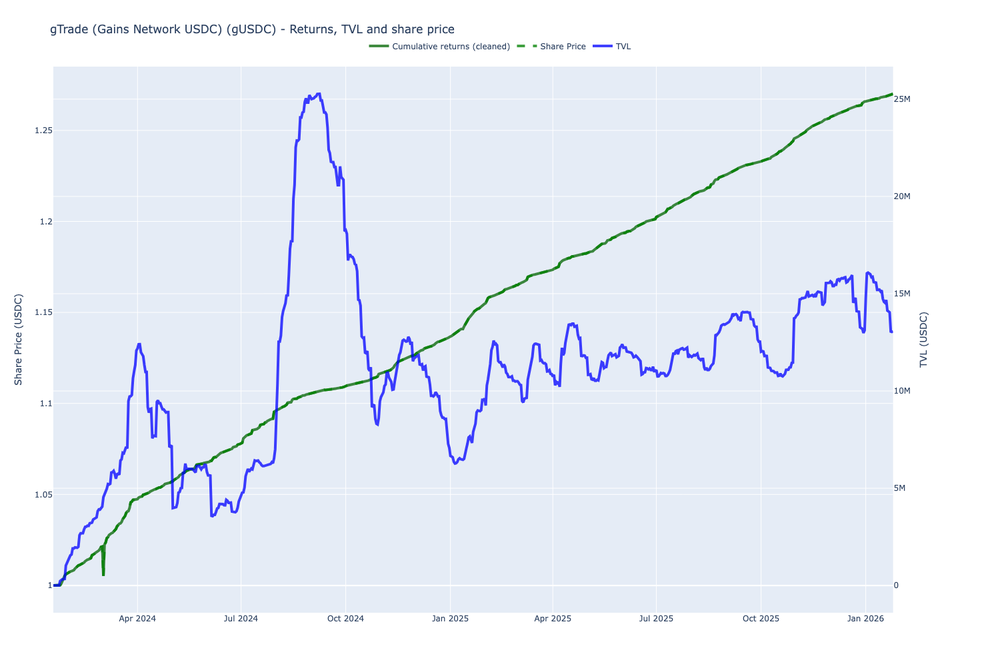

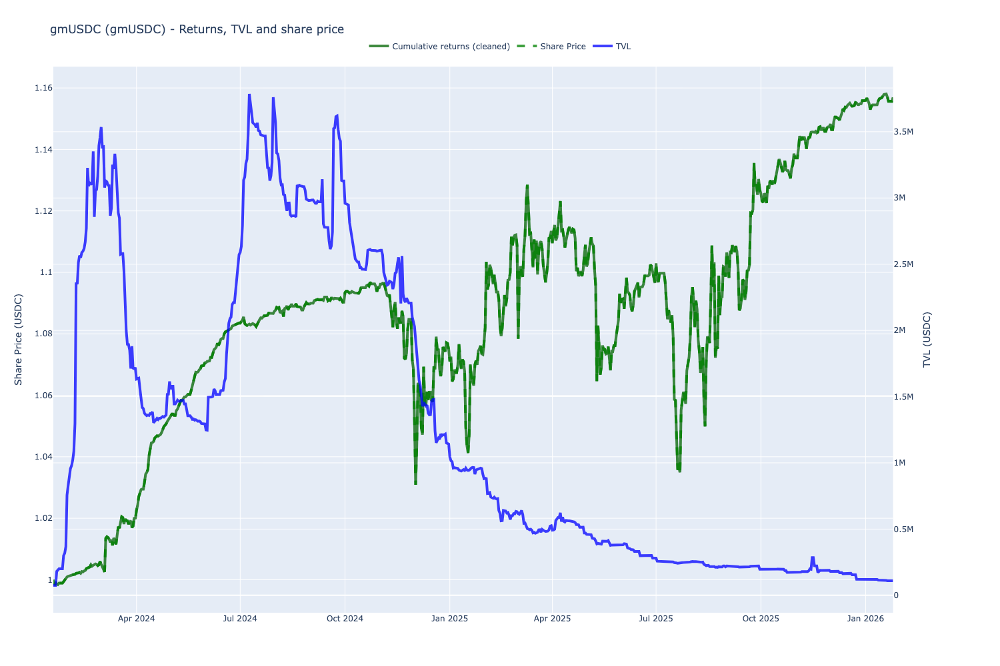

In [11]:
from tradeexecutor.analysis.vault import visualise_vaults

figures = chart_renderer.render(all_vaults_share_price_and_tvl)
for fig in figures:
    fig.show()

# Time range for backtest

- Choose the backtesting time range
- Start when we have enough assets (`Parameters.min_asset_universe`) in our asset universe to form the first basket

In [12]:
series = indicator_data.get_indicator_series("all_criteria_included_pair_count")

exceeds_threshold = series > Parameters.min_asset_universe
# Get the first date where the condition is True
backtest_start = Parameters.backtest_start
backtest_end = Parameters.backtest_end

print(f"Time range is {backtest_start} - {backtest_end}")

Time range is 2025-01-01 00:00:00 - 2026-01-15 00:00:00


# Algorithm and backtest

- Run the backtest

In [13]:
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput, IndicatorDataNotFoundWithinDataTolerance
from tradeexecutor.state.visualisation import PlotKind
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.weighting import weight_by_1_slash_n, weight_passthrouh, weight_equal
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.strategy.pandas_trader.yield_manager import YieldManager, YieldRuleset, YieldWeightingRule, YieldDecisionInput
from tradeexecutor.strategy.execution_context import ExecutionContext, ExecutionMode


_cached_start_times: dict[int, pd.Timestamp] = {}

def create_yield_rules(
    timestamp: pd.Timestamp,
    parameters: StrategyParameters,
    strategy_universe: TradingStrategyUniverse,
) -> YieldRuleset:
    """Create yield rules for the strategy."""
    weights = []
    for vault_spec in VAULTS:
        vault_pair = strategy_universe.get_pair_by_smart_contract(vault_spec[1])
        if vault_pair not in _cached_start_times:
            price_df = strategy_universe.data_universe.candles.get_samples_by_pair(vault_pair.internal_id)
            assert price_df is not None
            index_entry = price_df.index[0]
            assert isinstance(index_entry, tuple)
            _cached_start_times[vault_pair] = index_entry[1]
        
        availability = _cached_start_times[vault_pair]
        if timestamp > availability:
            weights.append(
            YieldWeightingRule(
                pair=vault_pair, 
                max_concentration=1.00,
                max_pool_participation=0.05,
            ),
            )

    if len(weights) == 0:
        return None
    
    return YieldRuleset(
        position_allocation=parameters.allocation,
        buffer_pct=parameters.directional_trade_yield_buffer_pct,
        cash_change_tolerance_usd=parameters.yield_flow_dust_threshold,
        weights=weights
    )


def decide_trades(
    input: StrategyInput
) -> list[TradeExecution]:
    """For each strategy tick, generate the list of trades."""
    parameters = input.parameters
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()
    
    # Live trading automation not yet enabled -
    # manually check positions while the strategy is in beta mode
    if input.execution_context.mode != ExecutionMode.backtesting:
        return []
            
    # Build signals for each pair
    alpha_model = AlphaModel(
        timestamp,
        close_position_weight_epsilon=parameters.min_portfolio_weight,  # 10 BPS is our min portfolio weight
    )

    tvl_included_pair_count = indicators.get_indicator_value(
        "tvl_included_pair_count",
    )

    # Get pairs included in this rebalance cycle.
    # This includes pair that have been pre-cleared in inclusion_criteria()
    # with volume, volatility and TVL filters
    included_pairs = indicators.get_indicator_value(
        "inclusion_criteria",
        na_conversion=False,
    )
    if included_pairs is None:
        included_pairs = []

    # Set signal for each pair
    signal_count = 0
    for pair_id in included_pairs:
        pair = strategy_universe.get_pair_by_id(pair_id)

        if not state.is_good_pair(pair):
            # Tradeable flag set to False, etc.
            continue

        pair_signal = indicators.get_indicator_value("signal", pair=pair)
        if pair_signal is None:
            continue

        weight = pair_signal

        if weight < 0:
            continue

        alpha_model.set_signal(
            pair,
            weight,
        )

        # Diagnostics reporting
        signal_count += 1

    # Calculate how much dollar value we want each individual position to be on this strategy cycle,
    # based on our total available equity
    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()
    portfolio_target_value = equity * parameters.allocation

    alpha_model.select_top_signals(count=999)
    alpha_model.assign_weights(method=weight_passthrouh)
    # alpha_model.assign_weights(method=weight_by_1_slash_n)

    #
    # Normalise weights and cap the positions
    #
    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=parameters.per_position_cap_of_pool,  # This is how much % by all pool TVL we can allocate for a position
        missing_tvl_placeholder_usd=0.0,  # Placeholder for missing TVL data until we get the data off the chain        
    )

    alpha_model.normalise_weights(
        investable_equity=portfolio_target_value,
        size_risk_model=size_risk_model,
        max_weight=parameters.max_concentration,
        max_positions=parameters.max_assets_in_portfolio,
        waterfall=True,
    )

    # Load in old weight for each trading pair signal,
    # so we can calculate the adjustment trade size
    alpha_model.update_old_weights(
        state.portfolio,
        ignore_credit=False,
    )
    alpha_model.calculate_target_positions(position_manager)

    # Shift portfolio from current positions to target positions
    # determined by the alpha signals (momentum)

    # rebalance_threshold_usd = portfolio_target_value * parameters.min_rebalance_trade_threshold_pct
    rebalance_threshold_usd = parameters.individual_rebalance_min_threshold_usd

    assert rebalance_threshold_usd > 0.1, "Safety check tripped - something like wrong with strat code"
    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=rebalance_threshold_usd,  # Don't bother with trades under XXXX USD
        invidiual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold,
        execution_context=input.execution_context,
    )

    # # Move cash in and out yield managed to cover spot positions
    # yield_result = None 
    # if parameters.use_managed_yield:

    #     rules = create_yield_rules(
    #         timestamp,
    #         parameters, 
    #         strategy_universe,
    #     )

    #     if rules is not None:
    #         yield_manager = YieldManager(
    #             position_manager=position_manager,
    #             rules=rules,
    #         )

    #         yield_input = YieldDecisionInput(
    #             execution_mode=input.execution_context.mode,
    #             cycle=input.cycle,
    #             timestamp=timestamp,
    #             total_equity=state.portfolio.get_total_equity(),
    #             directional_trades=trades,
    #             size_risk_model=size_risk_model,
    #             pending_redemptions=position_manager.get_pending_redemptions(),
    #         )

    #         yield_result = yield_manager.calculate_yield_management(yield_input)
    #         trades += yield_result.trades
        
    # Add verbal report about decision made/not made,
    # so it is much easier to diagnose live trade execution.
    # This will be readable in Discord/Telegram logging.
    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(t.get_value() for t in trades)

        report = dedent_any(f"""
        Cycle: #{input.cycle}
        Rebalanced: {'👍' if alpha_model.is_rebalance_triggered() else '👎'}
        Open/about to open positions: {len(state.portfolio.open_positions)} 
        Max position value change: {alpha_model.max_position_adjust_usd:,.2f} USD
        Rebalance threshold: {alpha_model.position_adjust_threshold_usd:,.2f} USD
        Trades decided: {len(trades)}
        Pairs total: {strategy_universe.data_universe.pairs.get_count()}
        Pairs meeting inclusion criteria: {len(included_pairs)}
        Pairs meeting TVL inclusion criteria: {tvl_included_pair_count}        
        Signals created: {signal_count}
        Total equity: {portfolio.get_total_equity():,.2f} USD
        Cash: {position_manager.get_current_cash():,.2f} USD
        Target value: {portfolio_target_value:,.2f} USD
        Investable equity: {alpha_model.investable_equity:,.2f} USD
        Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
        Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
        Discarted allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
        Rebalance volume: {rebalance_volume:,.2f} USD
        """)

        # Most volatility pair signal weight (normalised): {max_vol_signal.normalised_weight * 100 if max_vol_signal else '-'} % (got {max_vol_signal.position_size_risk.get_relative_capped_amount() * 100 if max_vol_signal else '-'} % of asked size)
        if top_signal:
            assert top_signal.position_size_risk
            report += dedent_any(f"""
            Top signal pair: {top_signal.pair.get_ticker()}
            Top signal value: {top_signal.signal}
            Top signal weight: {top_signal.raw_weight}
            Top signal weight (normalised): {top_signal.normalised_weight * 100:.2f} % (got {top_signal.position_size_risk.get_relative_capped_amount() * 100:.2f} % of asked size)
            """)

        for flag, count in alpha_model.get_flag_diagnostics_data().items():
            report += f"Signals with flag {flag.name}: {count}\n"

        state.visualisation.add_message(
            timestamp,
            report,
        )

        state.visualisation.set_discardable_data("alpha_model", alpha_model)

    return trades  # Return the list of trades we made in this cycle


result = run_backtest_inline(
    name=parameters.id,
    engine_version="0.5",
    decide_trades=decide_trades,
    create_indicators=indicators.create_indicators,
    client=client,
    universe=strategy_universe,
    parameters=parameters,
    # log_level=logging.INFO,
    max_workers=1,
    start_at=backtest_start,
    end_at=backtest_end,
)

state = result.state

all_trades = list(state.portfolio.get_all_trades())
trade_count = len(all_trades)
print(f"Backtesting completed, backtested strategy made {trade_count} trades, {state.cycle} cycles executed, last cycle at {state.last_cycle_at} w/ open positions {state.last_open_positions_cycle_at}")
if len(all_trades) > 0:
    print(f"First trade at {all_trades[0].executed_at}, last trade at {all_trades[-1].executed_at}")

# Add state to the further charts
chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    state=state,
)


Reading cached indicators rolling_returns, tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusi…

Using indicator cache /Users/moo/.cache/indicators/arbitrum_1d_19_2024-01-18-2026-01-26_ff


  0%|          | 0/32745600 [00:00<?, ?it/s]

Backtesting completed, backtested strategy made 90 trades, 55 cycles executed, last cycle at 2026-01-12 00:04:01 w/ open positions 2026-01-12 00:04:01
First trade at 2025-07-07 00:00:00, last trade at 2026-01-12 00:00:00


# Performance metrics

- Display portfolio performance metrics
- Compare against buy and hold matic using the same initial capital

**Note**: Some of these metrics might be incorrect due to slow start of the strategy

In [14]:
from tradeexecutor.analysis.multi_asset_benchmark import compare_strategy_backtest_to_multiple_assets

df = chart_renderer.render(performance_metrics)
display(df)

,Strategy,ETH
Start Period,2024-12-30,2024-12-30
End Period,2026-01-12,2026-01-12
Risk-Free Rate,0.0%,0.0%
Time in Market,15.0%,98.0%
Cumulative Return,18.11%,-14.95%
CAGR﹪,17.44%,-14.47%
Sharpe,3.5,0.15
Prob. Sharpe Ratio,100.0%,56.23%
Smart Sharpe,3.38,0.15
Sortino,16.81,0.23


# Equity curve

- Equity curve shows how your strategy accrues value over time

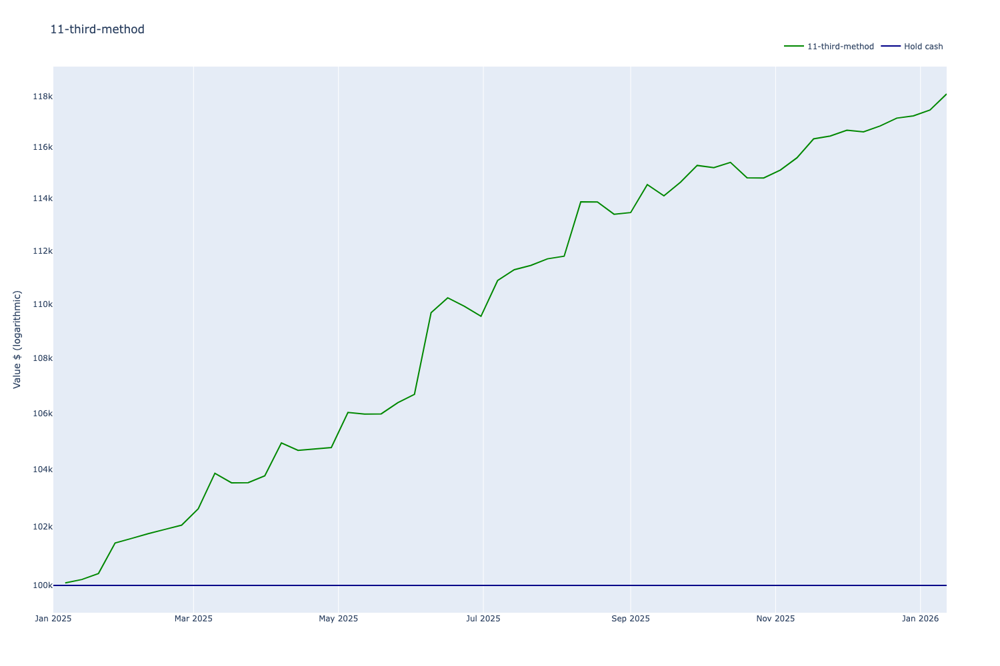

In [15]:
fig = chart_renderer.render(
    equity_curve_with_benchmark, 
)

fig.show()

## Equity curve with drawdown

- Linear curve

In [16]:

fig = chart_renderer.render(equity_curve_with_drawdown)

# Asset weights

- What assets were allocated over time
- Do both proportional % and USD weights

## Volatiles only

In [17]:
# fig = chart_renderer.render(volatile_weights_by_percent)
# fig.show()

print("Currently the strategy does not take directional positions")

Currently the strategy does not take directional positions


## Volatiles and non-volatiles

- Portfolio with cash, lending and vault positions

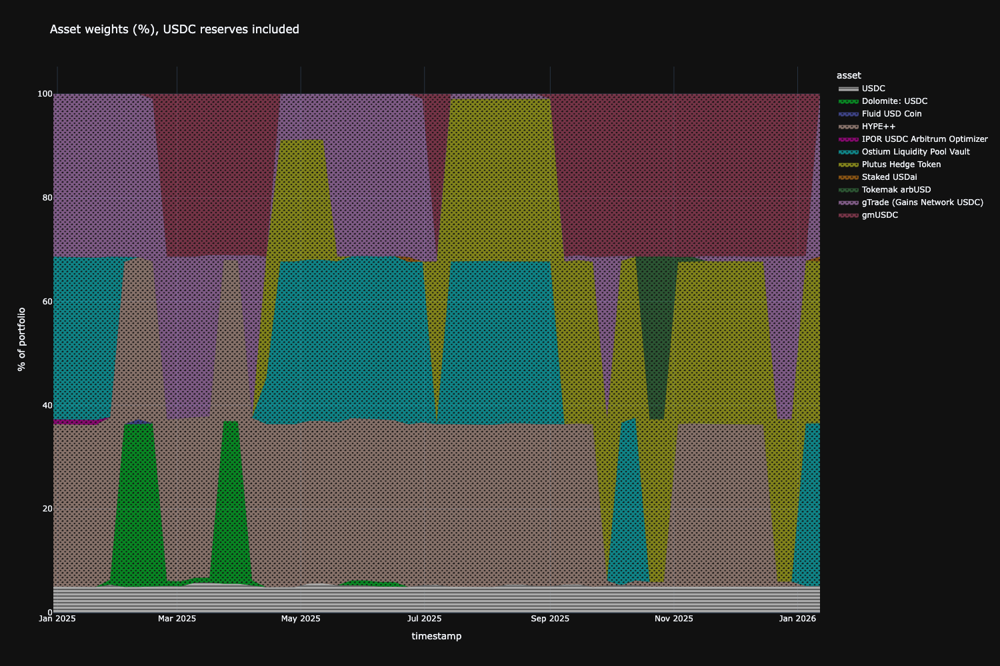

In [18]:

fig = chart_renderer.render(volatile_and_non_volatile_percent)
fig.show()
    

## Portfolio equity curve breakdown by asset

- Where did we make the profit

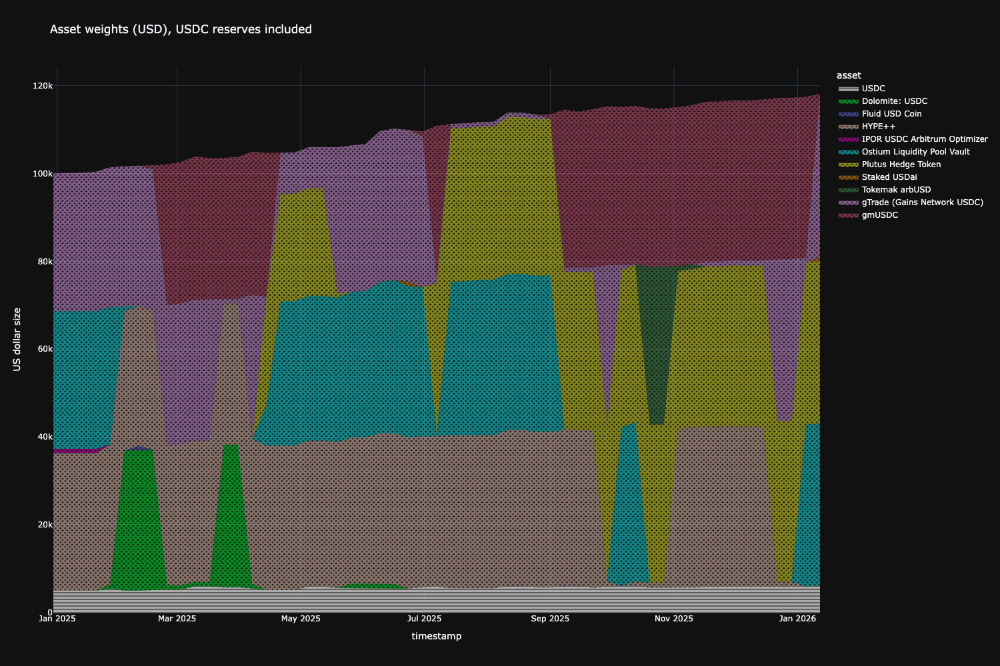

In [19]:
fig = chart_renderer.render(equity_curve_by_asset)
fig.show()

## Weight allocation statistics



In [20]:
stats = chart_renderer.render(weight_allocation_statistics)
display(stats)


,At,Pair,Value,Unit
Name,,,,
Max position (excluding USDC),2026-01-12 00:00:00,Ostium Liquidity Pool Vault,"37,028.61",USD
Min position (excluding USDC),2024-12-30 00:00:00,IPOR USDC Arbitrum Optimizer,950.00,USD
Mean position (excluding USDC),,,"25,992.31",USD
Max position (excluding USDC),2025-08-04 00:00:00,Ostium Liquidity Pool Vault,33.32,%
Min position (excluding USDC),2025-06-16 00:00:00,Dolomite: USDC,0.97,%
Mean position (excluding USDC),,,25.00,%
Max position (including USDC),2025-08-04 00:00:00,Ostium Liquidity Pool Vault,31.66,%
Min position (including USDC),2025-06-16 00:00:00,Dolomite: USDC,0.92,%
Mean position (including USDC),,,20.00,%


# Positions at the end

Some example positions at the end


In [21]:
stats = chart_renderer.render(positions_at_end)
display(stats)

,token,value
position_id,,
14,plvHedge,36827.606085
21,gUSDC,37028.613645
22,oLP,37028.613645
23,sUSDai,1122.079201


# Strategy thinking

- At the end of strategy
- Reverse order - last timestamp first

In [22]:
df = chart_renderer.render(last_messages)
display(df)

,0
2026-01-12 00:00:00,"Cycle: #55 Rebalanced: 👍 Open/about to open positions: 5 Max position value change: 36,723.80 USD Rebalance threshold: 500.00 USD Trades decided: 4 Pairs total: 19 Pairs meeting inclusion criteria: 16 Pairs meeting TVL inclusion criteria: 17 Signals created: 16 Total equity: 118,113.60 USD Cash: 6,036.81 USD Target value: 112,207.92 USD Investable equity: 112,207.92 USD Accepted investable equity: 112,207.92 USD Allocated to signals: 112,207.92 USD Discarted allocation because of lack of lit liquidity: 0.00 USD Rebalance volume: 0.00 USD Top signal pair: oLP-USDC Top signal value: 0.028933880681221626 Top signal weight: 0.028933880681221626 Top signal weight (normalised): 33.00 % (got 100.00 % of asked size) Signals with flag capped_by_concentration: 3 Signals with flag individual_trade_size_too_small: 12 Signals with flag close_position_weight_limit: 1 Signals with flag closed: 1"
2026-01-05 00:00:00,"Cycle: #54 Rebalanced: 👍 Open/about to open positions: 5 Max position value change: 36,827.61 USD Rebalance threshold: 500.00 USD Trades decided: 4 Pairs total: 19 Pairs meeting inclusion criteria: 16 Pairs meeting TVL inclusion criteria: 17 Signals created: 16 Total equity: 117,472.43 USD Cash: 5,925.09 USD Target value: 111,598.81 USD Investable equity: 111,598.81 USD Accepted investable equity: 111,598.81 USD Allocated to signals: 111,598.81 USD Discarted allocation because of lack of lit liquidity: 0.00 USD Rebalance volume: 0.00 USD Top signal pair: oLP-USDC Top signal value: 0.013717646175658047 Top signal weight: 0.013717646175658047 Top signal weight (normalised): 33.00 % (got 100.00 % of asked size) Signals with flag capped_by_concentration: 3 Signals with flag individual_trade_size_too_small: 12 Signals with flag close_position_weight_limit: 1 Signals with flag closed: 1"


# Alpha model diagnostics data

- Dump out alpha model contents from the last cycle

In [23]:
df = chart_renderer.render(alpha_model_diagnostics)
display(df)

print("Total asked:", df["Asked size"].replace("-", float("nan")).dropna().sum())
print("Total accepted:", df["Accepted size"].dropna().sum())

,Signal,Asked size,Accepted size,Value adjust USD,Weights (raw),Weights (norm/cap),Old weight,Flipping,TVL,Flags
Pair,,,,,,,,,,
ipUSDCfusion-USDC,0.002095,-,0.000000,0.000000,0.002095,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
LVUSDT-USD₮0,0.002737,-,0.000000,0.000000,0.002737,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
sUSDC-USDC,0.003935,-,0.000000,0.000000,0.003935,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
gtUSDCc-USDC,0.004231,-,0.000000,0.000000,0.004231,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
dUSDC-USDC,0.004440,-,0.000000,0.000000,0.004440,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
eUSDC-5-USDC,0.004825,-,0.000000,0.000000,0.004825,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
CSHYUSDC-USDC,0.005432,-,0.000000,0.000000,0.005432,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
hyperUSDC-USDC,0.005731,-,0.000000,0.000000,0.005731,0.00,0.000000,none -> spot,0,individual_trade_size_too_small
arbUSD-USDC,0.006537,-,0.000000,0.000000,0.006537,0.00,0.000000,none -> spot,0,individual_trade_size_too_small


Total asked: 112207.92013687045
Total accepted: 112207.92013687045


/var/folders/8n/h2dzh5yx5470cc6c_12dwrjw0000gn/T/ipykernel_50309/2837413607.py:4: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



# Trading pair breakdown

- Trade success for each trading pair



In [24]:
df = chart_renderer.render(trading_pair_breakdown)
display(df)

,Trading pair,Positions,Trades,Total return %,Total PnL USD,Best,Worst,Avg,Median,Volume,Wins,Losses,Take profits,Stop losses,Trailing stop losses,Volatility
8,HYPE++,2,15,28.17%,"9,054.70",26.34%,1.82%,14.08%,14.08%,"144,971.37",2,0,0,0,0,12.26%
0,Plutus Hedge Token,2,10,12.36%,"4,295.76",12.36%,0.00%,6.18%,6.18%,"86,024.95",2,0,0,0,0,6.18%
7,gmUSDC,3,14,4.09%,"1,461.27",4.45%,-1.23%,1.36%,0.87%,"209,544.71",2,1,0,0,0,2.35%
1,gTrade (Gains Network USDC),4,19,3.58%,"1,804.15",1.76%,0.15%,0.90%,0.83%,"377,131.17",4,0,0,0,0,0.74%
2,Ostium Liquidity Pool Vault,5,14,3.10%,"1,018.96",4.14%,-3.63%,0.62%,0.74%,"311,119.30",4,1,0,0,0,2.51%
6,Dolomite: USDC,2,8,1.16%,355.27,0.61%,0.55%,0.58%,0.58%,"129,047.07",2,0,0,0,0,0.03%
4,IPOR USDC Arbitrum Optimizer,1,2,0.64%,6.10,0.64%,0.64%,0.64%,0.64%,"1,906.10",1,0,0,0,0,0.00%
9,Tokemak arbUSD,1,3,0.32%,114.69,0.32%,0.32%,0.32%,0.32%,"72,097.68",1,0,0,0,0,0.00%
5,Fluid USD Coin,1,2,0.18%,1.76,0.18%,0.18%,0.18%,0.18%,"1,935.40",1,0,0,0,0,0.00%
3,Staked USDai,2,3,0.09%,0.94,0.09%,0.00%,0.04%,0.04%,"3,211.45",1,1,0,0,0,0.04%


# Trading metrics

- Trading cost, etc.

In [25]:
df = chart_renderer.render(trading_metrics)
display(df)


,0
Trading period length,378 days 0 hours
Trading start,None
Trading end,None
Return %,18.11%
Annualised return %,17.49%
Cash at start,"$100,000.00"
Value at end,"$118,113.60"
Time in market,0.00%
Time in market volatile,0.00%
Trade volume,"$1,336,989.21"


# Interest accrued

- How much profit our non-volatile positions generated

## Lending pools

- Calculate interest from lending pools (Aave, etc)

In [26]:
df = chart_renderer.render(lending_pool_interest_accrued)
display(df)

,Metric,Value
0,Credit position count,0


# Vault performance

- Analyse the performance of our vaults

## Vault statistics 

- Calculate interest accrued on different vaults for the strategy

In [27]:
df = chart_renderer.render(vault_statistics)
display(df)

,Metric,Value
0,Position count,23
1,Total interest earned,"18,113.60 USD"
2,Avg interest,3.88%
3,Min interest,-94.73%
4,Max interest,57.57%
5,Avg credit position duration,"66 days, 6:15:39.130435"
6,Total deposit flow in,"715,441.26 USD"
7,Min deposit,519.62 USD
8,Avg deposit,"17,449.79 USD"
9,Max deposit,"36,827.61 USD"


## Vault position list

- Display individual positions taken in the vaults

In [28]:
df = chart_renderer.render(all_vault_positions)
display(df)

,Vault,Opened,Closed,Profit % annualised,Profit USD,Price on open,Price on close,Price diff %,Price diff % ann.,Deposits,Redeems
Id,,,,,,,,,,,
1,HYPE++,2024-12-30,2025-10-06 00:00:00,35.64,8396.33,1.06,1.39,31.46,24.13,2,9
4,IPOR USDC Arbitrum Optimizer,2024-12-30,2025-01-27 00:00:00,8.71,6.10,1.02,1.03,0.64,0.05,1,1
2,Ostium Liquidity Pool Vault,2024-12-30,2025-02-10 00:00:00,2.37,84.49,1.03,1.03,0.36,0.04,1,2
3,gTrade (Gains Network USDC),2024-12-30,2025-04-14 00:00:00,6.27,1115.64,1.14,1.18,3.85,1.11,2,3
5,Dolomite: USDC,2025-01-27,2025-04-14 00:00:00,2.64,349.12,1.16,1.18,2.16,0.46,3,3
6,Fluid USD Coin,2025-02-10,2025-02-17 00:00:00,9.96,1.76,1.05,1.05,0.18,0.00,1,1
7,gmUSDC,2025-02-17,2025-04-21 00:00:00,5.13,289.27,1.08,1.11,2.94,0.51,4,2
8,Plutus Hedge Token,2025-04-14,2025-05-26 00:00:00,0.00,0.00,1.02,1.02,-,-,1,2
9,Ostium Liquidity Pool Vault,2025-04-14,2025-07-07 00:00:00,19.28,1402.46,1.06,1.10,3.98,0.92,3,1


## Vault individual position timeline

- Show one of the vaults

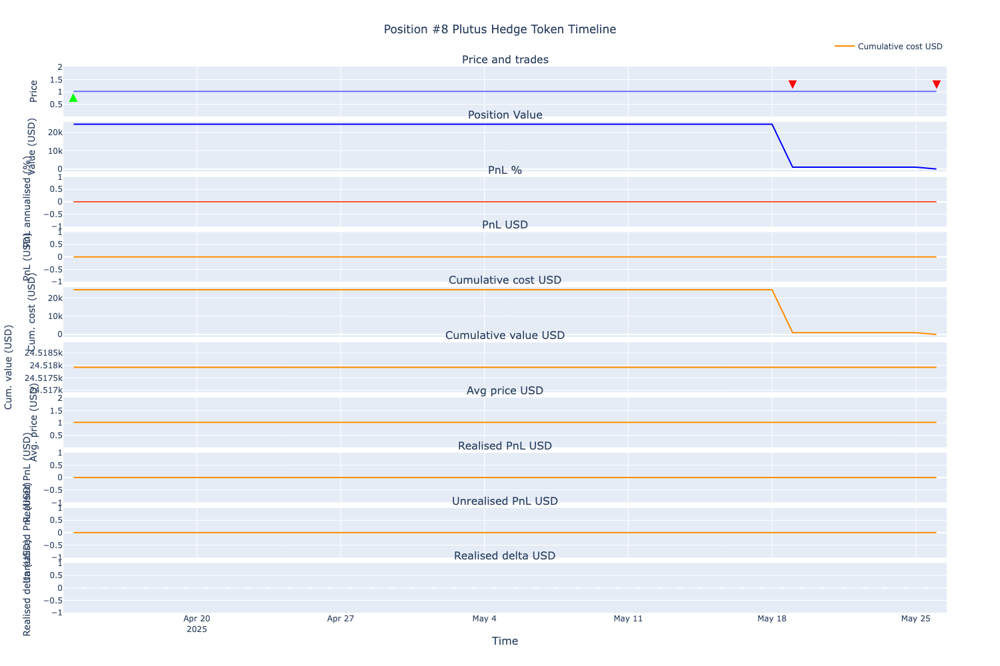

,quantity,delta,executed_price,fee,cumulative_cost,cumulative_value,avg_price,mark_price,value,realised_delta,realised_pnl,unrealised_pnl,realised_pnl_pct,unrealised_pnl_pct,total_pnl_pct,pnl_pct,pnl,duration,annual_periods,pnl_annualised
timestamp,,,,,,,,,,,,,,,,,,,,
2025-04-14,2.404452e+04,24044.515091,1.019689,0.0,2.451793e+04,24517.927549,1.019689,1.019689,2.451793e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0 days,inf,0.0
2025-04-15,2.404452e+04,0.000000,1.019689,0.0,2.451793e+04,24517.927549,1.019689,1.019689,2.451793e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1 days,365.000000,0.0
2025-05-18,2.404452e+04,0.000000,1.019689,0.0,2.451793e+04,24517.927549,1.019689,1.019689,2.451793e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,34 days,10.735294,0.0
2025-05-19,9.873859e+02,-23057.129196,1.019689,0.0,1.006827e+03,24517.927549,1.019689,1.019689,1.006827e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35 days,10.428571,0.0
2025-05-20,9.873859e+02,0.000000,1.019689,0.0,1.006827e+03,24517.927549,1.019689,1.019689,1.006827e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36 days,10.138889,0.0
2025-05-25,9.873859e+02,0.000000,1.019689,0.0,1.006827e+03,24517.927549,1.019689,1.019689,1.006827e+03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 days,8.902439,0.0
2025-05-26,5.684342e-13,-987.385895,1.019689,0.0,-5.684342e-13,24517.927549,1.019689,1.019689,5.796261e-13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42 days,8.690476,0.0


In [29]:
pair = strategy_universe.get_pair_by_smart_contract(address=VAULTS[0][1])

chart_renderer = ChartBacktestRenderingSetup(
    registry=charts,
    strategy_input_indicators=indicator_data,
    pairs=[pair],
    state=state,
)

fig, df = chart_renderer.render(vault_position_timeline)

if fig is not None:
    display(fig)

if df is not None:
    display(df)